# Setup

In [ ]:
# Standard libraries
import io
import csv
import random
import string

# External libraries
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
from bokeh.io import output_notebook, show
from bokeh.models import Circle, MultiLine, Legend, LegendItem
from bokeh.models.graphs import NodesAndLinkedEdges
from bokeh.palettes import Blues8, Turbo256, Blues256, Greens256, Oranges256
from bokeh.plotting import figure, from_networkx
import plotly.graph_objects as go
import plotly.express as px

# NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import RSLPStemmer, WordNetLemmatizer
nltk.download('stopwords')
nltk.download('rslp')
nltk.download('wordnet')

#sklearn
from sklearn.feature_extraction.text import CountVectorizer

# Spacy
import spacy
!python -m spacy download pt_core_news_sm
nlp = spacy.load("pt_core_news_sm")

# Stanza and Deplacy
!pip install deplacy stanza
import stanza
import deplacy

# Wordcloud
from wordcloud import WordCloud

# Graphviz
import graphviz

# Google Colab specific
from google.colab import files

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package rslp to /root/nltk_data...
[nltk_data]   Package rslp is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


2023-09-14 10:39:03.346130: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 23.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')


# NetworkPlotter3D

In [ ]:
class NetworkPlotter3D:
    def __init__(self, G, palette, communities, layout_function):
        self.G = G
        self.palette = palette
        self.communities = communities
        self.layout_function = layout_function
        self.pos = None
        self.edge_x = []
        self.edge_y = []
        self.edge_z = []
        self.node_x = []
        self.node_y = []
        self.node_z = []
        self.node_colors = []
        self.node_sizes = []
        self.hover_texts = []
        self._prepare_data()

    def _prepare_data(self):
        # Convert node names in the communities to integers if they aren't
        if not all(isinstance(node, int) for node in self.G.nodes()):
            mapping = {node: int(node) for node in self.G.nodes()}
            self.G = nx.relabel_nodes(self.G, mapping)

        # Convert node names in the communities to integers
        self.communities = [set(map(int, community)) for community in self.communities]

        # Compute modularity colors
        self._compute_modularity_colors()

        # Compute node metrics
        self._compute_node_metrics()

        # Compute node sizes based on eigenvector centrality
        self.node_sizes = self._compute_node_sizes()

        # Compute 3D positions
        self.pos = self.layout_function(self.G, dim=3, communities=self.communities)

        # Extract edge positions
        self._extract_edge_positions()

        # Extract node positions and hover texts
        self._extract_node_positions_and_hover_texts()

    def _compute_modularity_colors(self):
        modularity_color = {}
        for community_number, community in enumerate(self.communities):
            for name in community:
                modularity_color[name] = self.palette[community_number % len(self.palette)]
        # Ensure all nodes have a color
        default_color = "black"  # Default color for nodes not in any community
        for node in self.G.nodes():
            if node not in modularity_color:
                modularity_color[node] = default_color
        nx.set_node_attributes(self.G, modularity_color, 'modularity_color')
        self.node_colors = [modularity_color[node] for node in self.G.nodes()]


    def _compute_node_metrics(self):
        # Compute degree for each node
        degrees = dict(self.G.degree())
        nx.set_node_attributes(self.G, degrees, 'degree')

        # Compute eigenvector centrality for each node
        eigenvector_centrality = nx.eigenvector_centrality(self.G)
        nx.set_node_attributes(self.G, eigenvector_centrality, 'eigenvector_centrality')

        # Compute followers (in-degree) and following (out-degree) for each node
        followers = dict(self.G.in_degree())
        following = dict(self.G.out_degree())
        nx.set_node_attributes(self.G, followers, 'followers')
        nx.set_node_attributes(self.G, following, 'following')

    def _compute_node_sizes(self):
        centrality_values = [self.G.nodes[node]['eigenvector_centrality'] for node in self.G.nodes()]
        max_centrality = max(centrality_values)
        min_centrality = min(centrality_values)
        size_bounds = {'desired': {'lower': 5, 'upper': 50}, 'actual': {'lower': min_centrality, 'upper': max_centrality}}
        sizes = [size_bounds['desired']['lower'] + (x - size_bounds['actual']['lower']) * (size_bounds['desired']['upper'] - size_bounds['desired']['lower']) / (size_bounds['actual']['upper'] - size_bounds['actual']['lower']) for x in centrality_values]
        return sizes

    def _extract_edge_positions(self):
        for edge in self.G.edges():
            x0, y0, z0 = self.pos[edge[0]]
            x1, y1, z1 = self.pos[edge[1]]
            self.edge_x.extend([x0, x1, None])
            self.edge_y.extend([y0, y1, None])
            self.edge_z.extend([z0, z1, None])

    def _extract_node_positions_and_hover_texts(self):
        for node in self.G.nodes():
            self.node_x.append(self.pos[node][0])
            self.node_y.append(self.pos[node][1])
            self.node_z.append(self.pos[node][2])

            node_id_text = f"Node ID: {node}"
            community_text = f"Community: {self.G.nodes[node].get('modularity_class', 'N/A')}"
            degree_text = f"Degree: {self.G.nodes[node].get('degree', 'N/A')}"
            eigenvector_text = f"Eigenvector Centrality: {self.G.nodes[node].get('eigenvector_centrality', 'N/A'):.4f}"  # Rounded to 4 decimal places
            followers_text = f"Followers: {self.G.nodes[node].get('followers', 'N/A')}"
            following_text = f"Following: {self.G.nodes[node].get('following', 'N/A')}"

            hover_info = f"{node_id_text}<br>{community_text}<br>{degree_text}<br>{eigenvector_text}<br>{followers_text}<br>{following_text}"
            self.hover_texts.append(hover_info)

    def plot(self, title="Network Plot"):
        edge_trace = go.Scatter3d(x=self.edge_x, y=self.edge_y, z=self.edge_z, mode='lines', line=dict(width=0.5, color='gray'), showlegend=False, hoverinfo='none')
        node_trace = go.Scatter3d(x=self.node_x, y=self.node_y, z=self.node_z, mode='markers', marker=dict(size=self.node_sizes, color=self.node_colors, opacity=0.8), showlegend=False, text=self.hover_texts, hoverinfo='text')
        fig = go.Figure(data=[edge_trace, node_trace])
        for community_number, community_color in enumerate(palette):
          fig.add_trace(go.Scatter3d(x=[None], y=[None], z=[None], mode='markers', marker=dict(size=10, color=community_color), name=f"Community {community_number + 1}"))
        fig.update_layout(title={
            'text': title,
            'y': 0.9,
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {
                'size': 20,
                'color': 'black'
            }
        },
        scene=dict(aspectmode='data',
                   xaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False),
                   yaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False),
                   zaxis=dict(nticks=10, showspikes=False, showbackground=False, showline=False, zeroline=False, showgrid=False, showticklabels=False)),
                  margin=dict(t=20, b=20, r=20, l=20),
                  height=800)
        fig.show()

In [ ]:
def kamada_kawai_layout_strategy(G, **kwargs):
    dim = kwargs.get('dim', 2)
    return nx.kamada_kawai_layout(G, dim=dim)
#######
def get_palette_subset(palette, num_colors):
    if num_colors > len(palette):
        raise ValueError("Number of colors requested exceeds palette size.")

    step = len(palette) // num_colors
    start = random.randint(0, step)

    return palette[start::step][:num_colors]
##########
# Example usage:
subset_palette = get_palette_subset(Turbo256, 50)
#print(subset_palette)
###
def custom_3d_layout(G, **kwargs):
    communities = kwargs.get('communities', [])
    pos_initial = nx.kamada_kawai_layout(G, dim=3)

    # Calculate eigenvector centrality
    centrality = nx.eigenvector_centrality_numpy(G)

    new_positions = {}

    # Position community nodes
    for community in communities:
        # Identify the most influential user in the community
        influential_user = max(community, key=lambda x: centrality[x])
        new_positions[influential_user] = pos_initial[influential_user]

        # Position other community members around the influential user
        for member in community:
            if member != influential_user:
                # Calculate vector from influential user to member
                vector = np.array(pos_initial[member]) - np.array(pos_initial[influential_user])
                # Scale the vector to bring the member closer to the influential user
                vector *= 0.5
                new_positions[member] = tuple(np.array(pos_initial[influential_user]) + vector)

    # Position non-community nodes
    for node in G.nodes():
        if node not in new_positions:
            neighbors = list(G.neighbors(node))
            if neighbors:
                avg_position = np.mean([np.array(pos_initial[neighbor]) for neighbor in neighbors], axis=0)
                new_positions[node] = tuple(avg_position)
            else:
                # If the node has no neighbors, keep its initial position
                new_positions[node] = pos_initial[node]

    return new_positions


# Utilities

In [ ]:
def find_and_print_user_by_id(df, user_id):
    user_row = df[df['colab_user_id'] == user_id]
    if not user_row.empty:
        print(user_row)
    else:
        print(f"No row found with colab_user_id {user_id}")

# File URLs

In [ ]:
url_nodes = "https://drive.google.com/uc?id=1C04iiMkjoWStAbL19RcIAAE2uOnITejr&export=download"
#url_edges = "https://drive.google.com/uc?id=1qgDnfspXejVCuRaqUUFLIxYsMsbvZBaH&export=download" #full graph
url_edges = "https://drive.google.com/uc?id=1cAbt0F9Gb0_06wephtLi7RlI8qYTWWMW&export=download" # interactions 3 cidades
url_selected_events = "https://drive.google.com/uc?id=1LE6KriDSpUZaeDLA3S00PrvRlqcK8po5&export=download"
url_events = "https://drive.google.com/uc?id=1ve5bdHhtE0Kl4Pci8A6l6XIikkbl1Bwm&export=download"
url_swearwords = "https://drive.google.com/uc?id=1ZxF53adijiO_Q4dtVq25W1-o5w8aOR93&export=download"
url_emojis = "https://drive.google.com/uc?id=1nNx8J4smTg8NkXfD4Y4pfg-03P9uRDsO&export=download"

# Load Nodes File

In [ ]:
nodes = pd.read_csv(url_nodes, sep=',', decimal='.', header=0)
nodes

,colab_user_id,birth_date,city,education,gender,idade,race
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN
2,440321,1995-12-16,Niterói,secondary,female,28.0,brown
3,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white
4,427856,1960-05-04,Niterói,bachelor,male,63.0,white
...,...,...,...,...,...,...,...
57796,702775,1980-07-16,São Gonçalo,NaN,male,43.0,NaN
57797,362855,1983-01-07,Santo André,NaN,male,40.0,NaN
57798,947835,NaN,Serra,NaN,male,NaN,NaN
57799,694585,1974-10-20,São Gonçalo,secondary,male,49.0,brown


# Load Edges File

In [ ]:
edges = pd.read_csv(url_edges, sep=',', decimal='.', header=0)
edges

,source,target
0,113450,162519
1,113450,118923
2,113450,40367
3,113450,123242
4,113450,39850
...,...,...
25780,248233,58898
25781,248233,60405
25782,321685,284896
25783,321685,291751


# Load Selected Events

In [ ]:
selected_events = pd.read_csv(url_selected_events, sep=',', decimal='.', header=0)
selected_events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,city,lat,lon,deleted_at,city_id
0,398893,689995,cratera se formando junto ao meio fio da calça...,ATENDIMENTO,2022-08-22T12:32:45-0300,9761,Buraco nas vias,Maceió,-9.674018,-35.761009,NaN,69
1,445735,505906,poste com lâmpada queimada a varios meses.\n\n...,RECUSADO,2023-02-24T21:13:04-0300,11421,Lâmpada apagada à noite,São Gonçalo,-22.850234,-43.068530,NaN,3663
2,442170,431354,"Poste sem iluminação pública, desde a semana d...",FECHADO,2023-02-15T21:59:35-0300,1689,Lâmpada apagada à noite,Niterói,-22.892010,-43.091803,NaN,3638
3,420493,690592,venho por meio desta solicitação um pedido de...,FECHADO,2022-12-01T00:16:37-0300,9955,Descarte irregular de lixo,Mesquita,-22.797534,-43.441498,NaN,3633
4,406621,717058,Solicito me humilhando mais uma vez que troque...,FECHADO,2022-09-27T21:37:47-0300,11421,Lâmpada apagada à noite,São Gonçalo,-22.840175,-43.065324,NaN,3663
...,...,...,...,...,...,...,...,...,...,...,...,...
32916,318142,133757,Lampada apagada a noite,FECHADO,2021-10-06T21:06:33-0300,5645,Lâmpada apagada à noite,Novo Hamburgo,-29.722039,-51.143741,NaN,4204
32917,334283,91232,Todos os dias há o mesmo problema. Motoristas ...,FECHADO,2021-12-15T01:28:35-0300,5585,Ponto de infração de trânsito recorrente,Novo Hamburgo,-29.718532,-51.128758,NaN,4204
32918,435094,723243,"Um poste com ""4 pétalas"" lâmpadas LEDs em curt...",FECHADO,2023-01-29T07:46:32-0300,11680,Lâmpada apagada à noite,Diadema,-23.679597,-46.596144,NaN,4934
32919,453375,203800,Fio e cabo de aço pendurados. Perigo para pede...,FECHADO,2023-03-14T19:42:10-0300,1687,Fiação irregular,Niterói,-22.898819,-43.094667,NaN,3638


# Load All Events

In [ ]:
events = pd.read_csv(url_events, sep=',', decimal='.', header=0)
events = events.rename(columns={'id': 'event_id', 'user_id': 'colab_user_id', 'lng': 'lon'})
events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,lat,lon
0,5,623,Carro estacionado na calçada em Edelson Cabele...,RECUSADO,2013-03-06 18:59,7575,Ponto de infração de trânsito recorrente,-8.046207,-34.895451
1,8,68,Estacionamento da própria Prefeitura próximo a...,RECUSADO,2013-03-07 19:03,7575,Ponto de infração de trânsito recorrente,-8.126271,-34.903793
2,9,166,"Na esquina com a rua da Aurora, calçada da Com...",RECUSADO,2013-03-07 21:56,7546,Calçada irregular,-8.047074,-34.877379
3,10,164,Todos os dias a concessionária Auto Mar estaci...,RECUSADO,2013-03-08 00:51,7575,Ponto de infração de trânsito recorrente,-8.097561,-34.885641
4,11,733,"Diariamente, até mesmo em frente a prédio da p...",RECUSADO,2013-03-08 02:10,7575,Ponto de infração de trânsito recorrente,-8.043143,-34.891382
...,...,...,...,...,...,...,...,...,...
329689,377001,179101,"Esgoto escorrendo da caixa pluvial, situação c...",ABERTO,2022-05-23 17:54,1742,Vazamento de esgoto,-22.930053,-43.022251
329690,377002,664235,"Olá, prezados, solicito por favor a fixação de...",NOVO,2022-05-23 18:02,11064,Manutenção Predial Geral,-20.501867,-54.613311
329691,377003,681506,Limpeza em toda extensão da Rua José Bonifáci...,NOVO,2022-05-23 18:05,9955,Descarte irregular de lixo,-22.783890,-43.410561
329692,377004,404396,árvores na rua caindo sobre as casas Ponto ...,NOVO,2022-05-23 18:05,1699,Poda de árvore,-22.891748,-43.066333


# Collate unique user ids

In [ ]:
unique_colab_user_ids = pd.concat([edges['source'], edges['target']]).unique()
print(unique_colab_user_ids)

[113450 150053 186310 ... 204883 429922 467302]


# Filter events by unique user ids

In [ ]:
filtered_events = events[events['colab_user_id'].isin(unique_colab_user_ids)]
# Filter the events_selected_users DataFrame
filtered_events_selected_users = selected_events[selected_events['colab_user_id'].isin(unique_colab_user_ids)]

# Merge the filtered results of events and events_selected_users DataFrames
merged_events = pd.concat([filtered_events, filtered_events_selected_users], ignore_index=True)

merged_events

,event_id,colab_user_id,description,status,created_at,event_type_id,event_type_name,lat,lon,city,deleted_at,city_id
0,41,86,Árvore bloqueando a calçada,FECHADO,2013-03-17 16:55,7574,Poda de árvore,-8.037968,-34.876409,NaN,NaN,NaN
1,54,2,Barraca no meio da calçada na Marquês de Olind...,RECUSADO,2013-03-21 14:11,7558,Ocupação irregular de área pública,-8.063467,-34.872855,NaN,NaN,NaN
2,58,86,Utilização da calçada para estacionamento. Pad...,RECUSADO,2013-03-23 18:59,7558,Ocupação irregular de área pública,-8.105268,-34.887529,NaN,NaN,NaN
3,582,86,"Árvore batendo na fiação, que já está toda bag...",FECHADO,2013-04-22 19:13,3942,Poda de árvore,-23.601828,-46.658975,NaN,NaN,NaN
4,918,86,Entulho na calçada e o pedestre tem que passar...,FECHADO,2013-05-07 22:50,3938,Entulho na calçada/via pública,-23.604105,-46.669592,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,NOVO,2021-01-02T15:59:14-0300,9,Entulho na calçada/via pública,-23.629147,-46.493427,Santo André,2021-01-02T16:41:43-0300,5317.0
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",ABERTO,2021-03-13T02:42:58-0300,56,Ponto de exploração sexual de menores,-23.647119,-46.561029,Santo André,2021-07-18T01:58:17-0300,5317.0
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",NOVO,2021-05-02T23:34:19-0300,54,Infestação animais perigosos,-22.780779,-43.428578,Mesquita,2021-05-02T23:34:49-0300,3633.0
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",NOVO,2021-05-01T15:37:59-0300,46,Mato alto,-28.986578,-49.415328,Balneário Arroio do Silva,NaN,4438.0


In [ ]:
print(len(merged_events))

132846


# Sentiment Analysis Code

In [ ]:
# Inicializar os stemmers e lemmatizers
stemmer = RSLPStemmer()
lemmatizer = WordNetLemmatizer()

# Função para exibir o mapa sintático da frase utilizando Stanza e Deplacy
def exibirMapaSintatico(frase):
  nlp_stanza = stanza.Pipeline("pt")
  doc = nlp_stanza(frase)
  deplacy.render(doc)
  graphviz.Source(deplacy.dot(doc))

# Função para exibir a distribuição de palavras e nuvem de palavras
def visualizarDistribuicaoPalavras(collection, top):
  cv = CountVectorizer(stop_words=stopwords.words('portuguese'))
  words = cv.fit_transform(collection)
  sum_words = words.sum(axis=0)

  words_freq = [(word, sum_words[0, i]) for word, i in cv.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

  frequency = pd.DataFrame(words_freq, columns=['word', 'freq'])

  frequency.head(top).plot(x='word', y='freq', kind='bar', figsize=(20, 7), color='blue')
  wordcloud = WordCloud(background_color='white', width=1000, height=1000).generate_from_frequencies(dict(words_freq))
  plt.figure(figsize=(20, 8))
  plt.imshow(wordcloud)
  plt.title("WordCloud", fontsize=22)
  plt.show()

# Carregar o arquivo CSV com o dicionário Oplexicon
dict_oplexicon = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=1iUCi4LRaOnHpcthw86KpuYqNzFKlcpZn&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[2]
  dict_oplexicon[palavra] = polaridade

# Carregar o arquivo CSV com o dicionário Unilex
dict_unilex = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=1AViTEwjiwCwh2yoiCeNd-hjx2ysN5xxO&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[1]
  dict_unilex[palavra] = polaridade

# Carregar o arquivo CSV com o dicionário WordNetAffectBr
dict_wordnetaffectbr = {}
csvfile = pd.read_csv("https://drive.google.com/uc?id=18q63AB7uSVIyRMENi4Dgx9Kchn-yv_pe&export=download", low_memory=False)
for index, row in csvfile.iterrows():
  palavra = row[0]
  polaridade = row[1]
  dict_wordnetaffectbr[palavra] = polaridade

# Função de pré-processamento do texto
def preprocessamento(texto):
  texto = str(texto).lower()
  documento = nlp(texto)
  lista = []

  for token in documento:
    lista.append(lemmatizer.lemmatize(token.text))

  lista = [palavra for palavra in lista if palavra not in stopwords.words('portuguese') and palavra not in string.punctuation and not palavra.isdigit()]
  return lista

# Função para obter a polaridade da frase usando um dicionário
def obterPolaridade(frase, dicionario):
  #print("obterPolaridade: ", frase)
  frase_processada = preprocessamento(frase)
  #print("frase_processada: ", frase_processada)
  frase_polaridade = [float(dicionario.get(palavra, 0)) for palavra in frase_processada]
  #print("frase_polaridade: ", frase_polaridade)
  score = sum(frase_polaridade)
  #print("score: ", score)
  return score

# Função para analisar o sentimento da frase usando diferentes dicionários
def analisarSentimento(frase, dicionarios):
  scores = [obterPolaridade(frase, dicionario) for dicionario in dicionarios]
  return scores

# Função para imprimir os valores associados a cada palavra da frase
def printLexiconPhrase(frase):
  phrases = {}
  for palavra in frase.lower().translate(str.maketrans('', '', string.punctuation)).split(" "):
    phrases[palavra.strip()] = lexicon.get(palavra.strip(), None)
  for palavra, valor in phrases.items():
    print(palavra, ": ", valor)
# Função para criar o conjunto de dados a partir dos eventos do Colab
def criarDataset(colab_events):
  dataset = colab_events.drop(columns=['status', 'created_at', 'event_type_name'])
  return dataset

# Ajustando o motor de sentimento

# Adicionar palavras extras e corrigir valores de palavras no dicionário lexicon
lexicon = dict_oplexicon.copy()
lexicon.update(dict_unilex)
lexicon.update(dict_wordnetaffectbr)

In [ ]:
def normalize_lexicon(lexicon):
    """Normalizes the lexicon's values such that 0 remains unchanged,
    the most positive value becomes 1, and the most negative value becomes -1."""

    # Separate positive, negative, and neutral values
    positive_values = [v for v in lexicon.values() if v > 0]
    negative_values = [v for v in lexicon.values() if v < 0]

    # Find the maximum positive and minimum negative values for normalization
    max_positive = max(positive_values) if positive_values else 1
    min_negative = min(negative_values) if negative_values else -1

    # Normalize the lexicon values
    for word, value in lexicon.items():
        if value > 0:
            lexicon[word] = value / max_positive
        elif value < 0:
            lexicon[word] = value / abs(min_negative)  # Ensures normalization to [-1, 0]

    return lexicon
####
lexicon=normalize_lexicon(lexicon)

In [ ]:
palavras_lexicon = {
    "colabora": 1,
    "rua": 1,
    "iptu": -1,
    "prefeito": -1,
    "prefeitos": -1,
    "irregulares": -1,
    "indesejadas": -1,
    "bastasse": -1,
    "pública": 1,
    "horrorosas": -1,
    "indigência": -1,
    "inadequados": -1,
    "pt": -1,
    "psdb": -1,
    "pdt": -1,
    "corrupção": -1,
    "varias": -1,
    "árvore": 1,
    "urgente": 1,
    "número": 1,
    "frente": 1,
    "façam": -1,
    "asfaltem": -1,
    "prefeitura": 0.5,
    "sofreu": -1,
    "extremamente": -1,
    "mal": -1,
    "dejetos": -1,
    "vistoria": -1,
    "responsabilidade": -1,
    "secretaria": -1,
    "providência": -1,
    "gargalhadas": -1,
    "barulho": -1,
    "botequim": -1,
    "colab": -1,
    "algazarra": -1,
    "descaso": -1,
    "deveria": -1,
    "providências": -1,
    "reclamação": -1,
    "irrespirável": -1,
    "recorrentes": -1,
    "irregularidade": -1,
    "irregularidades": -1,
    "trabalhando": 1,
    "trabalhado": 1,
    "transparente": 1,
    "resolver": 0.5,
    "problemas": 0.5,
    "obstáculos": -1,
    "abismo": -1,
    "descumprimento": -1,
    "solicito": 1,
    "limpeza": 1,
    "porcaria": -1,
    "brasil": 0,
    "PT": -1,
    "PMN" : -1,
    "ENEL": -1,
    "CISP": -1
}
## adicionando palavras customizadas ao lexicon
for palavra, valor in palavras_lexicon.items():
  lexicon[palavra] = valor
## adicionadno palavroes ao lexicon
swearwords = pd.read_csv(url_swearwords, sep=',', decimal='.', header=None)
for word in swearwords.iloc[:, 0]:
    lexicon[word] = -50 - (2*len(word))
### adicionando emojis ao lexicon
emoji_df = pd.read_csv(url_emojis, sep=',', decimal='.', header=None)
for index, row in emoji_df.iterrows():
    if index == 0:
        continue
    emoji = row[0]
    sentiment = int(row[1])  # Convert sentiment to integer
    lexicon[emoji] = sentiment
##

In [ ]:
frase = "Eu amo esse app! 💖"
print("Polaridade da frase '", frase, "':", obterPolaridade(frase, lexicon))

Polaridade da frase ' Eu amo esse app! 💖 ': 1.1347770467836258


In [ ]:
# Testando a polaridade das frases de exemplo
frases_teste = [
    "Isso é culpa dos prefeitos que não ligam para a população",
    "Eu pago meu IPTU em dia é um absurdo isso acontecer",
    "Parabéns a prefeitura que tem trabalhado de uma forma transparente para resolver os problemas da cidade",
    "Fiação sem vergonha na Vila Olímpia. Fios caem até o chão, pondo em perigo a segurança do pedestre.",
    "Calçadão de Boa Viagem com várias depressões e buracos causados por infiltração de água",
    "O descumprimento da política nacional de mobilidade é evidente nessa intervenção feita na ponte Paulo Guerra. Não basta o resto da calçada da ponte estar esburacada e cheia de obstáculos, é preciso também abrir um abismo para o pedestre ter que ultrapassar. Essa alça construída para dar acesso ao Shopping Riomar é imoral e com certeza haverá atropelamentos, que chamarão de 'acidentes'. Não será acidente, será apenas o fruto de uma infraestrutura toda voltada para o fluxo de automóveis individuais em detrimento do pedestre em descumprimento a lei federal. Infelizmente o Ministério Público não intervém nesse caso. Ainda estamos muito longe de atingir a acessibilidade universal."
    "VEÍCULOS SOBRE AS CALÇADAS DIARIAMENTE E A PMN NÃO FAZ NADA - TENHO MAIS DE 100 RECLAMAÇÕES COMPROVADAS E NUNCA HOUVE OPERAÇÃO NO LOCAL."
]

for frase in frases_teste:
  print("Polaridade da frase '", frase, "':", obterPolaridade(frase, lexicon))
  print("BREAKDOWN LEXICON")
  printLexiconPhrase(frase)
  print()

Polaridade da frase ' Isso é culpa dos prefeitos que não ligam para a população ': -1.0058479532163742
BREAKDOWN LEXICON
isso :  None
é :  None
culpa :  -0.005847953216374269
dos :  None
prefeitos :  -1
que :  None
não :  None
ligam :  None
para :  None
a :  None
população :  None

Polaridade da frase ' Eu pago meu IPTU em dia é um absurdo isso acontecer ': -0.5819627192982455
BREAKDOWN LEXICON
eu :  None
pago :  -0.005847953216374269
meu :  None
iptu :  -1
em :  None
dia :  0.453125
é :  None
um :  None
absurdo :  -0.023391812865497075
isso :  None
acontecer :  -0.005847953216374269

Polaridade da frase ' Parabéns a prefeitura que tem trabalhado de uma forma transparente para resolver os problemas da cidade ': 3.625
BREAKDOWN LEXICON
parabéns :  None
a :  None
prefeitura :  0.5
que :  None
tem :  None
trabalhado :  1
de :  None
uma :  None
forma :  0.0625
transparente :  1
para :  None
resolver :  0.5
os :  None
problemas :  0.5
da :  None
cidade :  0.0625

Polaridade da frase ' Fiaçã

# Run sentiment analysis on User's posts

In [ ]:
 dataset = criarDataset(merged_events)

# Calcular os scores das postagens usando o lexicon
scores = []
for index, row in dataset.iterrows():
  post = row[2]
  score = obterPolaridade(post, lexicon)
  scores.append(score)

dataset["score"] = scores

In [ ]:
dataset

,event_id,colab_user_id,description,event_type_id,lat,lon,city,deleted_at,city_id,score
0,41,86,Árvore bloqueando a calçada,7574,-8.037968,-34.876409,NaN,NaN,NaN,1.0
1,54,2,Barraca no meio da calçada na Marquês de Olind...,7558,-8.063467,-34.872855,NaN,NaN,NaN,9.0
2,58,86,Utilização da calçada para estacionamento. Pad...,7558,-8.105268,-34.887529,NaN,NaN,NaN,9.0
3,582,86,"Árvore batendo na fiação, que já está toda bag...",3942,-23.601828,-46.658975,NaN,NaN,NaN,1.0
4,918,86,Entulho na calçada e o pedestre tem que passar...,3938,-23.604105,-46.669592,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,9,-23.629147,-46.493427,Santo André,2021-01-02T16:41:43-0300,5317.0,-16.0
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",56,-23.647119,-46.561029,Santo André,2021-07-18T01:58:17-0300,5317.0,0.0
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",54,-22.780779,-43.428578,Mesquita,2021-05-02T23:34:49-0300,3633.0,7.0
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",46,-28.986578,-49.415328,Balneário Arroio do Silva,NaN,4438.0,2.0


In [ ]:
# Define a custom normalization function
# Separate positive and negative scores
positive_scores = dataset[dataset['score'] > 0]['score']
negative_scores = dataset[dataset['score'] < 0]['score']

# Define a custom normalization function for positive scores
def normalize_positive(score):
    return 0.1 + (score / positive_scores.max()) * 0.9

# Define a custom normalization function for negative scores
def normalize_negative(score):
    return -0.9 + (score / negative_scores.min()) * 0.1

# Apply the custom normalization functions to their respective subsets
dataset.loc[dataset['score'] > 0, 'normalized_score'] = positive_scores.apply(normalize_positive)
dataset.loc[dataset['score'] < 0, 'normalized_score'] = negative_scores.apply(normalize_negative)
dataset.loc[dataset['score'] == 0, 'normalized_score'] = 0  # Neutral score remains as 0


# Print the result
dataset

,event_id,colab_user_id,description,event_type_id,lat,lon,city,deleted_at,city_id,score,normalized_score
0,41,86,Árvore bloqueando a calçada,7574,-8.037968,-34.876409,NaN,NaN,NaN,1.0,0.101865
1,54,2,Barraca no meio da calçada na Marquês de Olind...,7558,-8.063467,-34.872855,NaN,NaN,NaN,9.0,0.116788
2,58,86,Utilização da calçada para estacionamento. Pad...,7558,-8.105268,-34.887529,NaN,NaN,NaN,9.0,0.116788
3,582,86,"Árvore batendo na fiação, que já está toda bag...",3942,-23.601828,-46.658975,NaN,NaN,NaN,1.0,0.101865
4,918,86,Entulho na calçada e o pedestre tem que passar...,3938,-23.604105,-46.669592,NaN,NaN,NaN,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
132841,258206,293209,Vizinho fez uma reforma na casa e simplesmente...,9,-23.629147,-46.493427,Santo André,2021-01-02T16:41:43-0300,5317.0,-16.0,-0.888732
132842,274342,319241,"Porque não coloca GCM, uma Base nessa praça? ...",56,-23.647119,-46.561029,Santo André,2021-07-18T01:58:17-0300,5317.0,0.0,0.000000
132843,285040,197268,"Olá, no telhado do imóvel localizado na avenid...",54,-22.780779,-43.428578,Mesquita,2021-05-02T23:34:49-0300,3633.0,7.0,0.113057
132844,284833,95084,"Boa tarde, no sambaqui de Balneario arroio do ...",46,-28.986578,-49.415328,Balneário Arroio do Silva,NaN,4438.0,2.0,0.103731


# Filter Best and worse scores

In [ ]:
# Filtrar os piores e melhores scores
worst_scores = dataset.sort_values(by='score', ascending=True).head(1000)
best_scores = dataset.sort_values(by='score', ascending=False).head(1000)

In [ ]:
best_scores = best_scores.sort_values(by='score', ascending=False)
best_scores

,event_id,colab_user_id,description,event_type_id,lat,lon,city,deleted_at,city_id,score,normalized_score
113077,336896,236585,"boa tarde! venho solicitar a prefeitura, que a...",1678,-22.907433,-43.071291,NaN,NaN,NaN,482.5,1.000000
118186,347360,236585,bom dia prefeitura! é desgastante conviver dia...,1678,-22.907503,-43.071225,NaN,NaN,NaN,358.0,0.767772
95526,301616,344258,estou solicitando a poda desta árvore dês do d...,3361,-23.681553,-46.531474,NaN,NaN,NaN,280.0,0.622280
93238,297657,236585,"bom dia! desde o dia 30/06, que quase não esta...",1678,-22.907467,-43.071161,NaN,NaN,NaN,250.0,0.566321
108695,327846,236585,Venho solicitar através de vcs. Que a concessi...,1678,-22.907473,-43.071071,NaN,NaN,NaN,246.0,0.558860
...,...,...,...,...,...,...,...,...,...,...,...
9326,93918,130981,Minha indignação dessa vez é com a POPULAÇÃO!!...,1710,-22.941287,-43.023258,NaN,NaN,NaN,61.0,0.213782
13211,115693,165856,"cratera na Av Prefeito Sylvio Picanço, antes d...",1713,-22.913398,-43.079905,NaN,NaN,NaN,61.0,0.213782
3156,30135,59354,Quais são os dias que a CLIN faz Varrição na p...,1693,-22.943510,-43.015933,NaN,NaN,NaN,61.0,0.213782
7090,70402,58970,Desde o dia da chuva forte continua da mesma f...,1674,-22.876404,-43.089634,NaN,NaN,NaN,61.0,0.213782


In [ ]:
filtered_rows = dataset[dataset['colab_user_id'] == 344258]
filtered_rows

,event_id,colab_user_id,description,event_type_id,lat,lon,city,deleted_at,city_id,score,normalized_score
70857,259065,344258,está interferindo na rede elétrica onde com o ...,3361,-23.681495,-46.531420,NaN,NaN,NaN,10.0,0.118653
70858,259066,344258,a árvore está muito grande interferindo na red...,3361,-23.681495,-46.531420,NaN,NaN,NaN,14.0,0.126114
84843,283580,344258,boa tarde já pedi a poda desta árvore em janei...,3361,-23.681602,-46.531396,NaN,NaN,NaN,39.5,0.173679
95526,301616,344258,estou solicitando a poda desta árvore dês do d...,3361,-23.681553,-46.531474,NaN,NaN,NaN,280.0,0.622280
119176,349312,344258,todos os dias fecham a rua de carros dos dois ...,3323,-23.663656,-46.524132,NaN,NaN,NaN,33.0,0.161554
120557,351991,344258,ponto de carga e descarga irregular onde nós p...,3346,-23.663789,-46.524175,NaN,NaN,NaN,-9.5,-0.893310


# Word Cloud

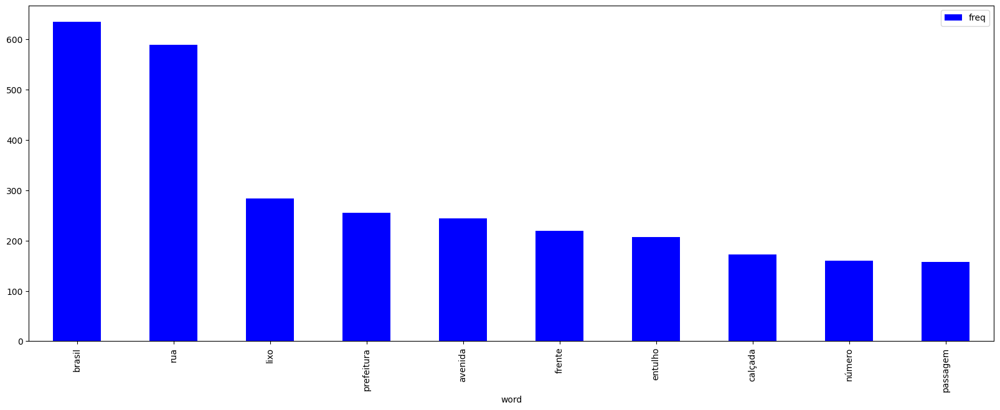

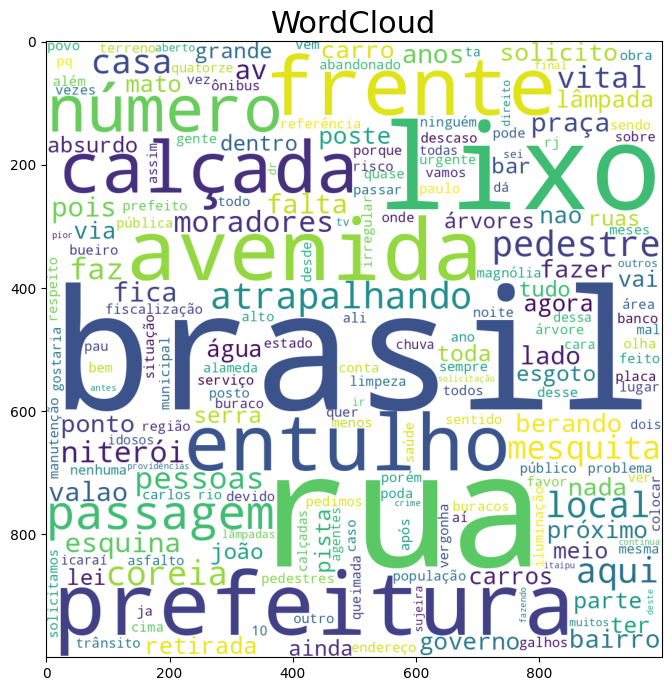

In [ ]:
# Visualizar a distribuição de palavras nos piores scores
visualizarDistribuicaoPalavras(worst_scores['description'], 10)

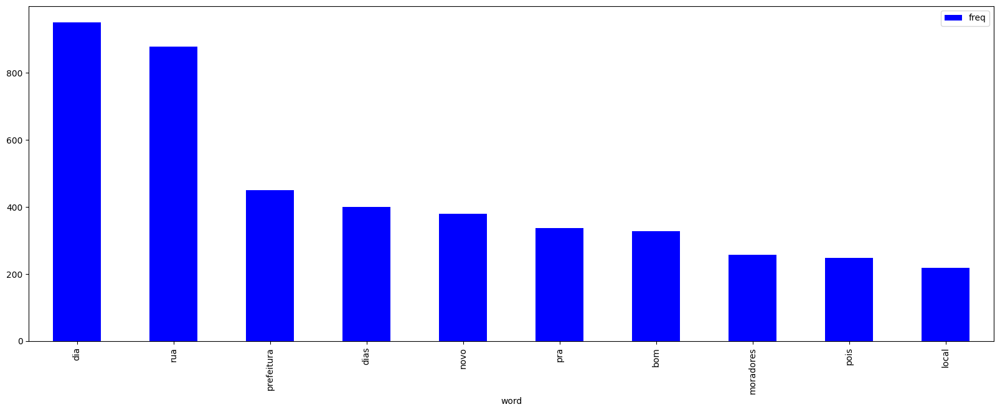

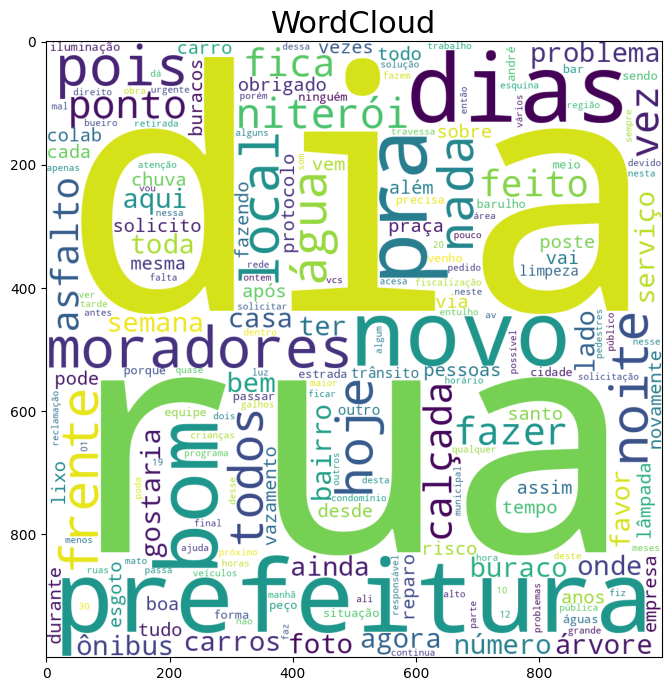

In [ ]:
# Visualizar a distribuição de palavras nos melhores scores
visualizarDistribuicaoPalavras(best_scores['description'], 10)

# Aggregate user's score

In [ ]:
# Group by 'colab_user_id' and aggregate
agg_data = dataset.groupby('colab_user_id').agg(
    number_of_posts=pd.NamedAgg(column='normalized_score', aggfunc='size'),
    average_score=pd.NamedAgg(column='normalized_score', aggfunc='mean')
).reset_index()

agg_data

,colab_user_id,number_of_posts,average_score
0,2,19,-0.427127
1,86,49,-0.403740
2,5384,7,-0.323404
3,6734,1,-0.896127
4,7259,2,-0.447535
...,...,...,...
4564,948054,1,0.122383
4565,958191,2,-0.398363
4566,968676,7,-0.321777
4567,970536,10,-0.082419


In [ ]:
sorted_agg_data = agg_data.sort_values(by='average_score', ascending=False)
sorted_agg_data

,colab_user_id,number_of_posts,average_score
1236,135483,1,0.448808
2258,208469,1,0.357409
4144,354679,1,0.348083
3500,292518,1,0.307047
4362,428934,1,0.303316
...,...,...,...
1709,177723,1,-0.899296
2805,232607,1,-0.899296
3088,253762,1,-0.899648
4485,671607,1,-0.899648


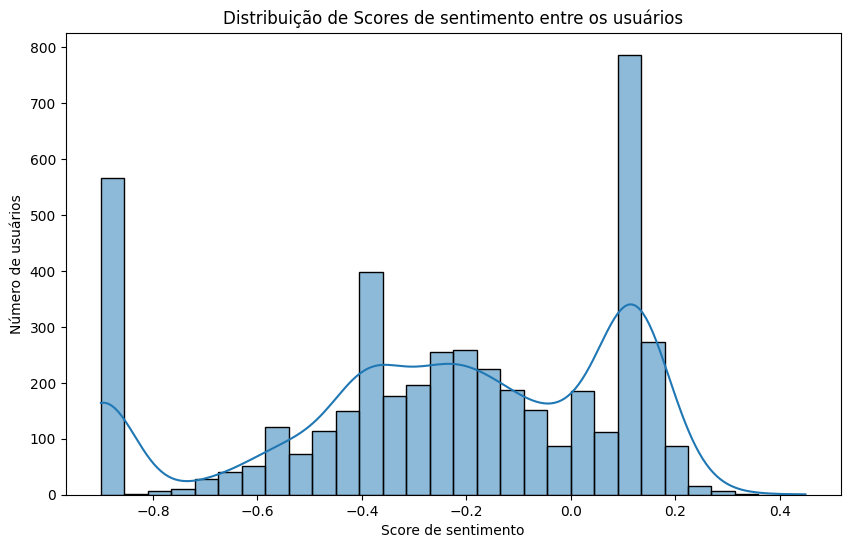

In [ ]:
# Distribution plot (histogram) of aggregate scores
plt.figure(figsize=(10, 6))
sns.histplot(agg_data['average_score'], bins=30, kde=True)
plt.title('Distribuição de Scores de sentimento entre os usuários')
plt.xlabel('Score de sentimento')
plt.ylabel('Número de usuários')
plt.show()

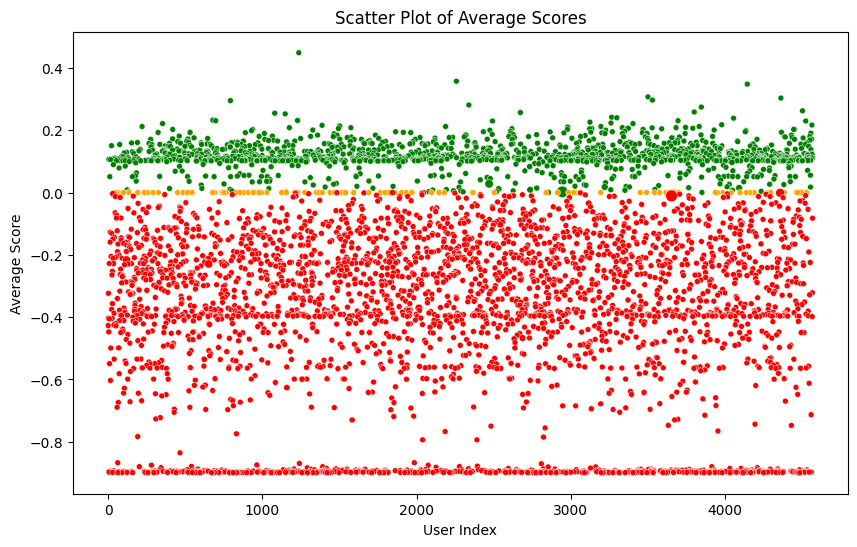

In [ ]:
# Define a function to map scores to colors
def score_to_color(score):
    if score > 0:
        return "green"
    elif score < 0:
        return "red"
    else:
        return "orange"

# Apply the function to create a new 'color' column
sorted_agg_data['color'] = sorted_agg_data['average_score'].apply(score_to_color)

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=sorted_agg_data,
    x=sorted_agg_data.index,
    y='average_score',
    hue='color',
    size='number_of_posts',  # Use number_of_posts for marker size
    palette={"red": "red", "orange": "orange", "green": "green"},
    legend=False
)
plt.title('Scatter Plot of Average Scores')
plt.xlabel('User Index')
plt.ylabel('Average Score')
plt.show()


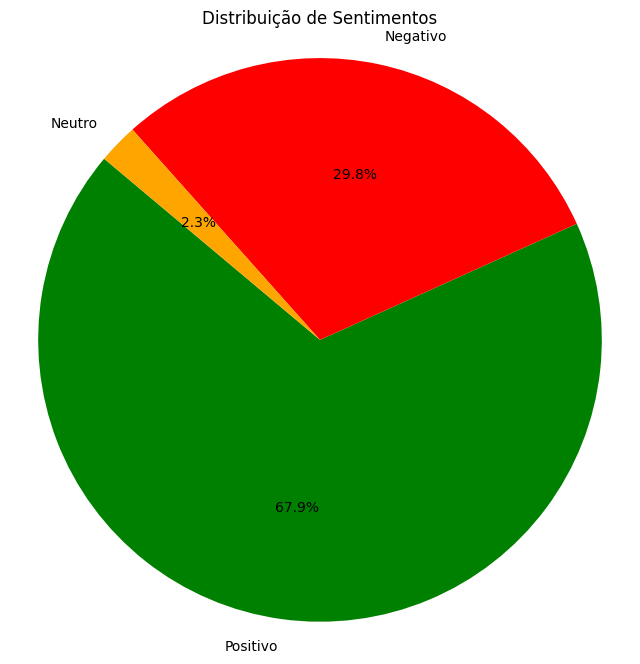

In [ ]:
# Calculate the count of each sentiment category
sentiment_counts = sorted_agg_data['color'].value_counts()

# Create a pie chart with custom labels
labels = ['Positivo', 'Negativo', 'Neutro']
colors = ['green', 'red', 'orange']

plt.figure(figsize=(8, 8))
plt.pie(sentiment_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Distribuição de Sentimentos')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [ ]:
# Calculate the average score for each event type
event_type_avg_scores = dataset.groupby('event_type_id')['score'].mean()

# Find the event type with the highest positive average score
most_positive_event_type_id = event_type_avg_scores.idxmax()
most_positive_avg_score = event_type_avg_scores.max()

# Find the event type with the lowest (most negative) average score
most_negative_event_type_id = event_type_avg_scores.idxmin()
most_negative_avg_score = event_type_avg_scores.min()

# Print the results
print(f"Most Positive Event Type ID: {most_positive_event_type_id}, Average Score: {most_positive_avg_score}")
print(f"Most Negative Event Type ID: {most_negative_event_type_id}, Average Score: {most_negative_avg_score}")

Most Positive Event Type ID: 113, Average Score: 84.0
Most Negative Event Type ID: 483, Average Score: -60.5


Number of Posts by Gender and Sentiment:
sentiment     Negative  Neutral  Positive
gender                                   
female            5216     1596      8820
male             25544    33086     54730
non_binary           0        0         1
not_informed        74       21        85
others            1582      501      1579


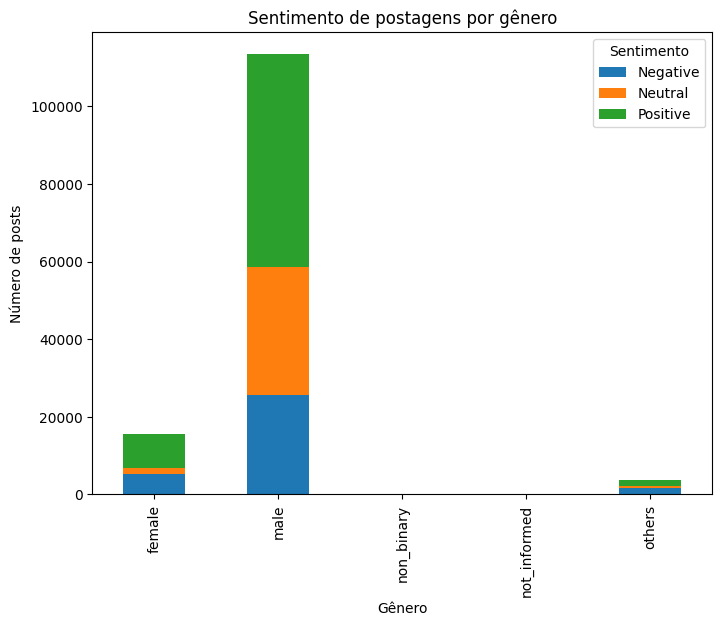

In [ ]:
# Merge the 'dataset' and 'nodes' DataFrames on 'colab_user_id'
merged_data = dataset.merge(nodes, on='colab_user_id', how='inner')
# Define a function to classify scores into positive, negative, or neutral
def classify_sentiment(score):
    if score > 0:
        return 'Positive'
    elif score < 0:
        return 'Negative'
    else:
        return 'Neutral'

# Apply the sentiment classification to 'normalized_score' and create a 'sentiment' column
merged_data['sentiment'] = merged_data['normalized_score'].apply(classify_sentiment)
# Calculate the number of posts by gender and sentiment
gender_sentiment_counts = merged_data.groupby(['gender', 'sentiment']).size().unstack(fill_value=0)
# Print the counts
print("Number of Posts by Gender and Sentiment:")
print(gender_sentiment_counts)

# Reset the index to move 'gender' to columns
gender_sentiment_counts.reset_index(inplace=True)

# Create a stacked bar chart
gender_sentiment_counts.set_index('gender').plot(kind='bar', stacked=True, figsize=(8, 6))
plt.title('Sentimento de postagens por gênero')
plt.xlabel('Gênero')
plt.ylabel('Número de posts')
plt.legend(title='Sentimento', loc='upper right')
plt.show()

In [ ]:
agg_data.to_csv('colab_sentiment_aggregate_3_cidades.csv', encoding='utf-8-sig', index=False)

In [ ]:
# Group by 'event_type_id' and 'event_type_name' to get unique combinations
unique_event_types = merged_events.groupby(['event_type_id', 'event_type_name']).size().reset_index()

# Rename the columns for clarity
unique_event_types.columns = ['event_type_id', 'event_type_name', 'count']

# Print the result
print(unique_event_types)

     event_type_id                      event_type_name  count
0                1                    Semáforo quebrado      3
1                2         Iluminação pública irregular      5
2                3                      Buraco nas vias    222
3                4      Foco de mosquito da dengue/zika      7
4                5                       Poda de árvore     72
..             ...                                  ...    ...
489          12373                              Destoca      2
490          12420              Rede de Saúde Municipal      1
491          12421                  Pavimentação de via      1
492          12549  Sarjeta- Reconstrução/renivelamento      1
493          12551                  Vielas / Escadarias      1

[494 rows x 3 columns]


In [ ]:
# Define a function to classify scores into positive, negative, or neutral
def classify_sentiment(score):
    if score > 0:
        return "positive"
    elif score < 0:
        return "negative"
    else:
        return "neutral"

# Choose an event type ID for analysis
chosen_event_type_id = 9908

# Filter the DataFrame for the chosen event type ID
event_type_data = dataset[dataset['event_type_id'] == chosen_event_type_id]

# Classify the scores into positive, negative, or neutral
event_type_data['sentiment'] = event_type_data['score'].apply(classify_sentiment)

# Count the number of positive, negative, and neutral posts
sentiment_counts = event_type_data['sentiment'].value_counts()

# Print the counts
print(f"Event Type ID {chosen_event_type_id}:")
print(f"Positive Posts: {sentiment_counts['positive']}")
print(f"Negative Posts: {sentiment_counts['negative']}")
print(f"Neutral Posts: {sentiment_counts['neutral']}")

Event Type ID 9908:
Positive Posts: 18879
Negative Posts: 2292
Neutral Posts: 23102


<ipython-input-46-2a40ed7eed59>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_type_data['sentiment'] = event_type_data['score'].apply(classify_sentiment)


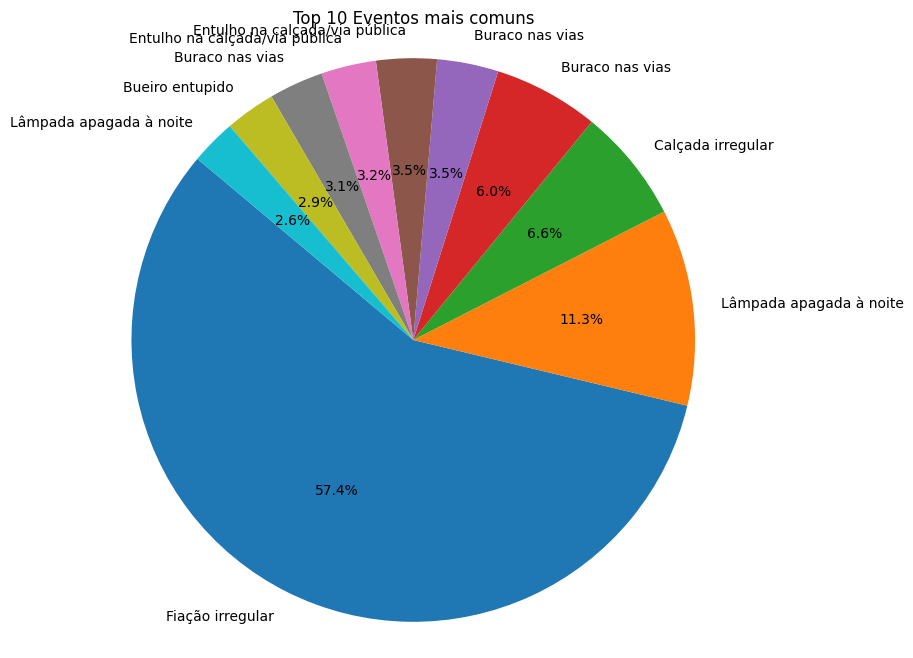

In [ ]:
# Count the occurrences of each event type ID and sort them in descending order
event_type_counts = dataset['event_type_id'].value_counts().sort_values(ascending=False)

# Select the top 10 most common event type IDs
top_10_event_types = event_type_counts.head(10)

# Get the event type names from unique_event_types
event_type_names = unique_event_types[unique_event_types['event_type_id'].isin(top_10_event_types.index)]['event_type_name']

# Create a pie chart with event type names as labels
plt.figure(figsize=(8, 8))
plt.pie(top_10_event_types, labels=event_type_names, autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Eventos mais comuns')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [ ]:
# Count the occurrences of each event type ID and sort them in descending order
event_type_counts = dataset['event_type_id'].value_counts().sort_values(ascending=False)

# Select the top 10 most common event type IDs
top_10_event_types = event_type_counts.head(100)

# Get the event type names from unique_event_types
event_type_names = unique_event_types[unique_event_types['event_type_id'].isin(top_10_event_types.index)]['event_type_name']

# Calculate the percentages
percentages = (top_10_event_types / top_10_event_types.sum()) * 100

# Print the event labels and their percentages
for event_name, percentage in zip(event_type_names, percentages):
    print(f"Event Name: {event_name}, Percentage: {percentage:.1f}%")


Event Name: Buraco nas vias, Percentage: 34.7%
Event Name: Entulho na calçada/via pública, Percentage: 6.8%
Event Name: Lâmpada apagada à noite, Percentage: 4.0%
Event Name: Bueiro entupido, Percentage: 3.7%
Event Name: Bueiro sem tampa, Percentage: 2.1%
Event Name: Ponto de alagamento, Percentage: 2.1%
Event Name: Vazamento de água, Percentage: 1.9%
Event Name: Falta de água, Percentage: 1.9%
Event Name: Ocupação irregular de área pública, Percentage: 1.7%
Event Name: Ponto recorrente de poluição sonora, Percentage: 1.6%
Event Name: Estabelecimento com condição sanitária irregular, Percentage: 1.5%
Event Name: Fiação irregular, Percentage: 1.5%
Event Name: Falta de energia, Percentage: 1.4%
Event Name: Lâmpada apagada à noite, Percentage: 1.3%
Event Name: Lâmpada acesa de dia, Percentage: 1.3%
Event Name: Iluminação pública irregular, Percentage: 1.2%
Event Name: Lixeira quebrada, Percentage: 1.2%
Event Name: Entulho na calçada/via pública, Percentage: 1.1%
Event Name: Descarte irregu

# Network Analysis

In [ ]:
# Criar um grafo direcionado a partir do DataFrame de arestas
filtered_nodes = nodes[nodes['colab_user_id'].isin(edges['source']) | nodes['colab_user_id'].isin(edges['target'])]
G = nx.from_pandas_edgelist(edges, source='source', target='target', create_using=nx.DiGraph())
print(G)
print(len(filtered_nodes))

DiGraph with 6904 nodes and 25785 edges
6904


In [ ]:
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
filtered_nodes

<ipython-input-50-9d14f749d7de>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)


,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,6.222080e-03
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,6.968046e-03
3,355872,1996-05-02,Niterói,unfinished_bachelor,female,27.0,white,3.078415e-66
9,43311,1975-06-18,Niterói,bachelor,male,48.0,white,7.759843e-04
26,236585,1959-02-07,Niterói,primary,female,64.0,white,2.428647e-02
...,...,...,...,...,...,...,...,...
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,2.754230e-03
57023,467302,1997-01-30,Niterói,unfinished_bachelor,female,26.0,NaN,1.600776e-64
57251,213426,NaN,Niterói,NaN,NaN,NaN,NaN,2.864402e-05
57337,251594,NaN,Niterói,NaN,NaN,NaN,NaN,2.864402e-05


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")
#
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede 3 cidades")

Number of communities: 110
Largest community has 1674 nodes.
Smallest community has 2 nodes.
Average community size: 62.76
Modularity score: 0.6331
Number of communities: 82


In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)

In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)

In [ ]:
filtered_nodes

In [ ]:
# Get the unique user IDs from the nodes DataFrame
unique_user_ids_nodes = set(filtered_nodes['colab_user_id'])

unique_colab_user_ids = set(dataset['colab_user_id'].unique())

# Get the unique user IDs from the edges DataFrame (both source and target)
unique_user_ids_edges = set(edges['source']).union(set(edges['target']))

# Find the user IDs that are in the edges but not in the nodes DataFrame
missing_user_ids = unique_user_ids_edges - unique_user_ids_nodes

# Check if there are any missing user IDs
if len(missing_user_ids) > 0:
    print(f"Missing user IDs: {missing_user_ids}")
else:
    print("No missing user IDs found between nodes and edges.")
##
# Find the user IDs that are in the nodes but not in the dataset DataFrame
missing_user_ids = unique_user_ids_nodes - unique_colab_user_ids

# Check if there are any missing user IDs
if len(missing_user_ids) > 0:
    print(f"User Ids with no events: {missing_user_ids}")
else:
    print("No missing user IDs found in dataset.")

In [ ]:
print(len(missing_user_ids))
find_and_print_user_by_id(selected_events, 196613)

In [ ]:
# Iterate through the nodes of the graph 'G' and update node information
for colab_user_id in G.nodes():
    # Check if the 'colab_user_id' exists in the 'nodes_filtered' DataFrame
    if colab_user_id in filtered_nodes.index:
        # Get the node data from 'nodes_filtered'
        node_data = filtered_nodes.loc[colab_user_id]
        # Update the node attributes in 'G' with the data from 'nodes_filtered'
        G.nodes[colab_user_id].update(node_data.to_dict())

In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

NameError: ignored

In [ ]:
# Get the top 10 nodes with the largest number of posts
top_10_nodes = filtered_nodes.nlargest(10, 'number_of_posts')

# Print the top 10 nodes
print("Top 10 Nodes with the Largest Number of Posts:")
print(top_10_nodes[['colab_user_id', 'number_of_posts']])

NameError: ignored

In [ ]:
eigenvector_centralities = nx.eigenvector_centrality(G)

def print_top_users_info(G, nodes, num_top_users=10):
    # Get the top nodes with the largest number of posts
    top_nodes = nodes.nlargest(num_top_users, 'number_of_posts')

    for _, node_data in top_nodes.iterrows():
        node_id = node_data['colab_user_id']

        # Get the Eigenvector centrality for the node

        eigenvector_centrality = eigenvector_centralities.get(node_id, "Node not found")

        # Get the number of followers and following for the node
        in_degree = G.in_degree(node_id)
        out_degree = G.out_degree(node_id)

        # Get the number of posts and average score from nodes DataFrame
        number_of_posts = node_data['number_of_posts']
        average_score = node_data['average_score']
        event_type_id = node_data['event_type_id']
        gender = node_data['gender']
        age = node_data['idade']
        race = node_data['race']

        # Print node information
        print(f"Node ID: {node_id}")
        print(f"Eigenvector Centrality: {eigenvector_centrality}")
        print(f"Number of Followers: {in_degree}")
        print(f"Number of Following: {out_degree}")
        print(f"Number of Posts: {number_of_posts}")
        print(f"Average Score: {average_score}")
        print(f"Gender: {gender}")
        print(f"Age: {age}")
        print(f"Race: {race}")
        print("\n")

# Example usage:
# Replace G and nodes with your graph and nodes DataFrame
print_top_users_info(G, filtered_nodes)


Node ID: 318649
Eigenvector Centrality: 0.05851388893555524
Number of Followers: 24
Number of Following: 5
Number of Posts: 12287.0
Average Score: -0.010813594720222478
Gender: male
Age: 38.0
Race: 


Node ID: 240336
Eigenvector Centrality: 0.053235117791910175
Number of Followers: 13
Number of Following: 4
Number of Posts: 11609.0
Average Score: 0.0021797451764063087
Gender: male
Age: 49.0
Race: brown


Node ID: 425243
Eigenvector Centrality: 0.04224679055614464
Number of Followers: 15
Number of Following: 15
Number of Posts: 5310.0
Average Score: -0.001088758795172212
Gender: male
Age: 48.0
Race: brown


Node ID: 216238
Eigenvector Centrality: 0.13536324672567845
Number of Followers: 72
Number of Following: 17
Number of Posts: 4490.0
Average Score: 0.028086475625856644
Gender: male
Age: 59.0
Race: brown


Node ID: 186310
Eigenvector Centrality: 0.25521410241567366
Number of Followers: 133
Number of Following: 406
Number of Posts: 4185.0
Average Score: -0.0825202661235176
Gender: male

<ipython-input-194-9c9b23e36368>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['number_of_posts'] = pd.to_numeric(filtered_nodes['number_of_posts'], errors='coerce')
<ipython-input-194-9c9b23e36368>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_nodes['eigenvector_centrality'].fillna(0, inplace=True)
<ipython-input-194-9c9b23e36368>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

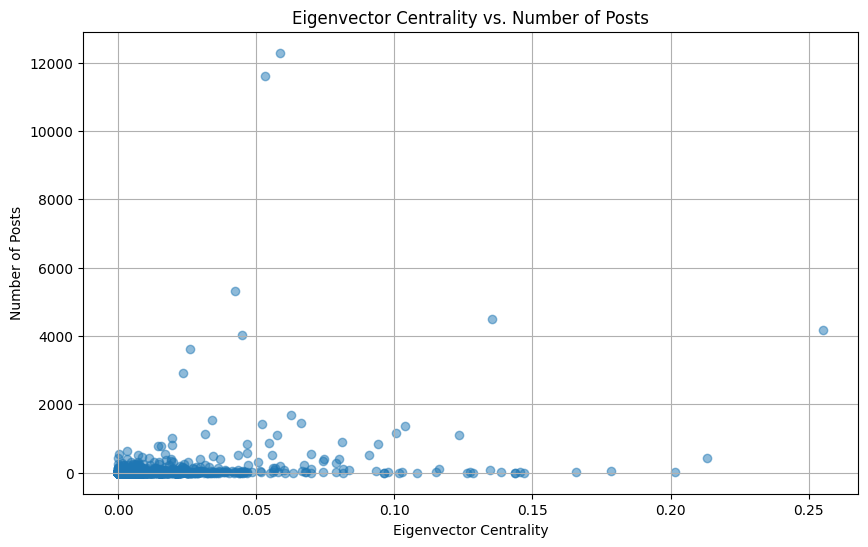

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Convert non-numeric values to NaN in the 'number_of_posts' column
filtered_nodes['number_of_posts'] = pd.to_numeric(filtered_nodes['number_of_posts'], errors='coerce')

# Replace NaN values with 0 in both columns
filtered_nodes['eigenvector_centrality'].fillna(0, inplace=True)
filtered_nodes['number_of_posts'].fillna(0, inplace=True)

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(filtered_nodes['eigenvector_centrality'], filtered_nodes['number_of_posts'], alpha=0.5)
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Number of Posts')
plt.title('Eigenvector Centrality vs. Number of Posts')
plt.grid(True)

# Show the plot
plt.show()


# Mesquita

In [ ]:
filename = "graph-mesquita.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 718 nodes and 3208 edges
DiGraph with 699 nodes and 3208 edges
699


<ipython-input-330-1f29004c48b9>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976
...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")
#
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Mesquita")

Number of communities: 21
Largest community has 333 nodes.
Smallest community has 2 nodes.
Average community size: 33.29
Modularity score: 0.4297
Number of communities: 13


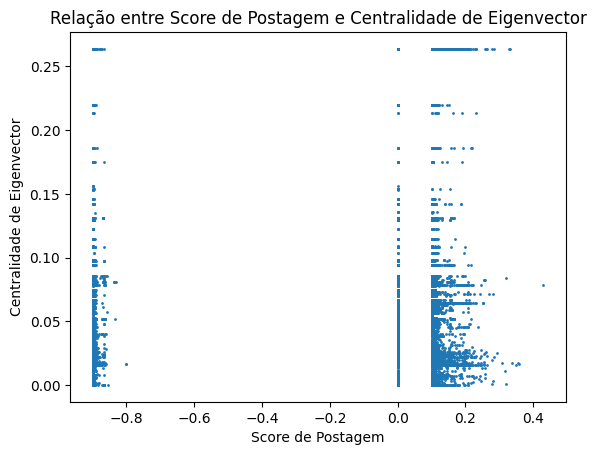

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-333-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769,11225.0
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091,65.0
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976,9957.0
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376,9979.0
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976,9961.0
...,...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624,NaN
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196,9978.0
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743,NaN
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-334-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-334-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
57,186310,1971-12-01,Mesquita,bachelor,male,52.0,black,0.263769,11225.0,4185.0,-0.082520
125,333167,1980-09-29,Mesquita,master,male,43.0,NaN,0.000091,65.0,2.0,-0.348738
252,345433,1965-02-05,Mesquita,bachelor,male,58.0,NaN,0.021976,9957.0,12.0,-0.291411
262,347006,1984-09-09,Mesquita,bachelor,male,39.0,white,0.108376,9979.0,1367.0,0.014758
304,405585,1988-05-10,Mesquita,bachelor,male,35.0,white,0.021976,9961.0,18.0,-0.323821
...,...,...,...,...,...,...,...,...,...,...,...
56338,202015,1977-10-12,Mesquita,bachelor,female,46.0,NaN,0.020624,NaN,NaN,NaN
56455,215738,1968-08-04,Mesquita,secondary,male,55.0,brown,0.014196,9978.0,20.0,0.048441
56565,205486,1986-07-21,Mesquita,unfinished_bachelor,male,37.0,NaN,0.004743,NaN,NaN,NaN
56610,209620,1985-09-14,Mesquita,NaN,male,38.0,NaN,0.001808,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Mesquita"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['NewCity1', 'NewCity2', 'NewCity3']  # You can define your own city values
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-335-ce57d3d10ced>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': -0.010801705615810914
Assortativity with respect to 'idade': -0.0001794463507593491
Assortativity with respect to 'gender': -0.03851940344661603
Assortativity with respect to 'education': -0.0008860204340206706
Assortativity with respect to 'race': -0.008231532339068422
Assortativity with respect to 'average_score': -0.009180885272246876
Assortativity with respect to 'city': -0.000623830318185699


In [ ]:
def jaccard_similarity(u, v):
    intersection = len(set(dataset.loc[dataset['colab_user_id'] == u, 'event_type_id']).intersection(set(dataset.loc[dataset['colab_user_id'] == v, 'event_type_id'])))
    union = len(set(dataset.loc[dataset['colab_user_id'] == u, 'event_type_id']).union(set(dataset.loc[dataset['colab_user_id'] == v, 'event_type_id'])))
    return intersection / union

# Calcular a matriz de similaridade de Jaccard entre todos os pares de usuários
user_ids = dataset['colab_user_id'].unique()
jaccard_matrix = pd.DataFrame(index=user_ids, columns=user_ids)
for u in user_ids:
    for v in user_ids:
        if u != v:
            similarity = jaccard_similarity(u, v)
            jaccard_matrix.loc[u, v] = similarity

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Certifique-se de ter calculado a matriz de similaridade de Jaccard (jaccard_matrix) conforme mencionado no código anterior

# Defina o estilo do mapa de calor
sns.set(style="whitegrid")

# Crie uma figura matplotlib
plt.figure(figsize=(10, 8))

# Crie um mapa de calor (heatmap) da matriz de similaridade de Jaccard
sns.heatmap(jaccard_matrix, cmap='coolwarm', annot=True, fmt=".2f")

# Adicione rótulos aos eixos
plt.xlabel('Usuário ID')
plt.ylabel('Usuário ID')

# Defina o título do gráfico
plt.title('Matriz de Similaridade de Jaccard entre Usuários')

# Exiba o gráfico
plt.show()

NameError: ignored

<Figure size 1000x800 with 0 Axes>

# Niterói

In [ ]:
filename = "graph-niteroi.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 1070 nodes and 4177 edges
DiGraph with 1070 nodes and 4177 edges
1070


<ipython-input-320-fd1472534201>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03
...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")
#
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Niterói")

Number of communities: 19
Largest community has 237 nodes.
Smallest community has 2 nodes.
Average community size: 56.32
Modularity score: 0.4796
Number of communities: 16


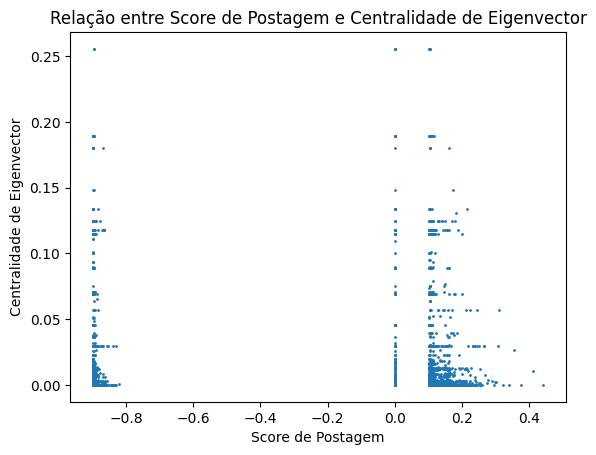

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-323-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03,1713.0
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12,12179.0
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12,1704.0
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15,1749.0
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03,1714.0
...,...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05,1699.0
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15,NaN
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10,NaN
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-324-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-324-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
71,149101,1970-12-21,Niterói,master,female,53.0,not_declared,2.272881e-03,1713.0,12.0,-0.169142
90,933798,1973-11-01,Niterói,bachelor,male,50.0,NaN,1.901778e-12,12179.0,19.0,-0.713252
154,235587,1986-07-26,Niterói,bachelor,female,37.0,brown,1.901778e-12,1704.0,6.0,-0.228532
165,113374,1991-06-10,Niterói,bachelor,male,32.0,black,1.741129e-15,1749.0,4.0,-0.666021
234,132925,1983-08-04,Niterói,bachelor,male,40.0,not_declared,5.404843e-03,1714.0,3.0,-0.223560
...,...,...,...,...,...,...,...,...,...,...,...
56460,137630,1976-01-08,Niterói,NaN,male,47.0,NaN,1.474204e-05,1699.0,2.0,-0.897535
56486,185203,1961-02-18,Niterói,bachelor,male,62.0,NaN,3.366184e-15,NaN,NaN,NaN
56505,184496,1992-03-10,Niterói,bachelor,female,31.0,NaN,7.086365e-10,NaN,NaN,NaN
56666,257781,2003-02-05,Niterói,bachelor,female,20.0,NaN,1.372083e-02,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Niterói"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['1', '2', '3']
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-325-61bf6a7d3cb9>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': 0.0014816751899927722
Assortativity with respect to 'idade': 0.010453185529845964
Assortativity with respect to 'gender': 0.07391889267146178
Assortativity with respect to 'education': 0.05252604106140072
Assortativity with respect to 'race': 0.008320595722567074
Assortativity with respect to 'average_score': -0.0019349896130290856
Assortativity with respect to 'city': 0.0


# Santo André

In [ ]:
filename = "graph-santo-andre.gexf"
# Very important: If the file read doesnt work, make sure the Gephi file is on the 1.2 format.
# Load the .gexf file
G = nx.read_gexf(filename)
G = nx.DiGraph(G)
# Print basic information about the graph
print(G)
#
edges_list = list(G.edges())
# Step 2: Create a DataFrame from the edge list
edges_df = pd.DataFrame(edges_list, columns=['source', 'target'])
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
G = nx.from_pandas_edgelist(edges_df, source='source', target='target', create_using=nx.DiGraph())
print(G)
#
nodes['colab_user_id'] = nodes['colab_user_id'].astype(int)
dataset['colab_user_id'] = dataset['colab_user_id'].astype(int)
# Get a set of all unique node IDs in the edges of graph G
unique_edge_nodes = set()
for u, v in G.edges():
    unique_edge_nodes.add(u)
    unique_edge_nodes.add(v)
# Filter the nodes DataFrame to include only nodes in unique_edge_nodes
unique_edge_nodes = set(int(node_id) for node_id in unique_edge_nodes)
#print(unique_edge_nodes)
##
filtered_nodes = nodes[nodes['colab_user_id'].isin(unique_edge_nodes)]
print(len(filtered_nodes))

##
# Calcular a centralidade de eigenvector para cada nó
eigenvector_centralities = nx.eigenvector_centrality(G)

# Adicionar as centralidades de eigenvector ao DataFrame 'filtered_nodes'
filtered_dataset = dataset[dataset['colab_user_id'].isin(filtered_nodes['colab_user_id'])]
filtered_nodes['eigenvector_centrality'] = filtered_nodes['colab_user_id'].map(eigenvector_centralities)
dataset['eigenvector_centrality'] = dataset['colab_user_id'].map(eigenvector_centralities)
##
filtered_nodes

DiGraph with 1212 nodes and 4511 edges
DiGraph with 1199 nodes and 4511 edges
1199


<ipython-input-312-13d4d1105de9>:37: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02
...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02


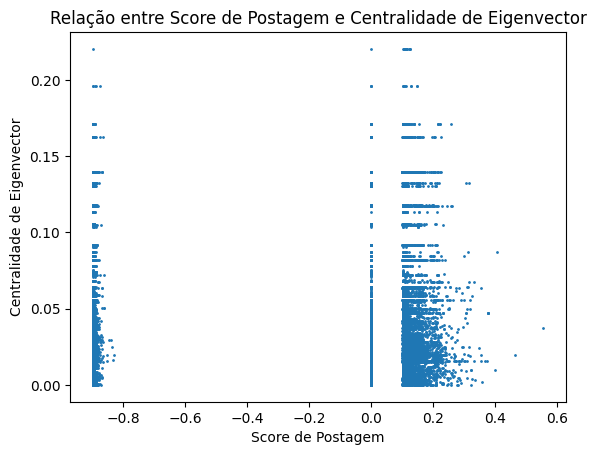

In [ ]:
# 1) Relação entre score de postagem e centralidade de eigenvector
plt.scatter(dataset['normalized_score'], dataset['eigenvector_centrality'], s=1)
plt.xlabel('Score de Postagem')
plt.ylabel('Centralidade de Eigenvector')
plt.title('Relação entre Score de Postagem e Centralidade de Eigenvector')
plt.show()

In [ ]:
# Calculate the count of posts for each user and event type
user_event_counts = dataset.groupby(['colab_user_id', 'event_type_id']).size().reset_index(name='count')
# Find the event type for which each user has the maximum count of posts
user_most_frequent_event = user_event_counts.groupby('colab_user_id')['event_type_id'].idxmax()

# Create a mapping between users and their most frequent event type
user_event_mapping = user_event_counts.loc[user_most_frequent_event]

# Create a dictionary to map users to their most frequent event type
user_to_event_type_mapping = dict(zip(user_event_mapping['colab_user_id'], user_event_mapping['event_type_id']))
filtered_nodes['event_type_id'] = filtered_nodes['colab_user_id'].map(user_to_event_type_mapping)
filtered_nodes

<ipython-input-313-6f7625bb4286>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02,3380.0
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02,3374.0
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12,3353.0
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04,3353.0
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02,3381.0
...,...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03,NaN
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02,NaN
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02,NaN
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02,NaN


In [ ]:
# Create a mapping between 'colab_user_id' and 'number_of_posts' and 'average_score'
user_to_posts_mapping = dict(zip(agg_data['colab_user_id'], agg_data['number_of_posts']))
user_to_average_score_mapping = dict(zip(agg_data['colab_user_id'], agg_data['average_score']))

# Add the 'number_of_posts' and 'average_score' columns to the 'nodes' DataFrame
filtered_nodes['number_of_posts'] = filtered_nodes['colab_user_id'].map(user_to_posts_mapping)
filtered_nodes['average_score'] = filtered_nodes['colab_user_id'].map(user_to_average_score_mapping)
filtered_nodes

<ipython-input-314-53773526a413>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-314-53773526a413>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,colab_user_id,birth_date,city,education,gender,idade,race,eigenvector_centrality,event_type_id,number_of_posts,average_score
0,323968,1969-08-11,Santo André,bachelor,female,54.0,white,4.757375e-02,3380.0,20.0,-0.404053
1,222051,1961-02-12,Santo André,primary,male,62.0,NaN,3.726603e-02,3374.0,94.0,-0.135769
27,262645,1973-07-18,Santo André,unfinished_bachelor,male,50.0,white,9.933837e-12,3353.0,10.0,-0.370519
31,290968,1977-12-16,Santo André,bachelor,female,46.0,NaN,4.365650e-04,3353.0,9.0,0.180311
33,332967,1974-01-26,Santo André,unfinished_bachelor,male,49.0,black,5.545779e-02,3381.0,311.0,-0.229544
...,...,...,...,...,...,...,...,...,...,...,...
56609,207412,1993-11-04,Santo André,primary,female,30.0,NaN,2.630363e-03,NaN,NaN,NaN
56796,211768,1988-10-23,Santo André,bachelor,female,35.0,NaN,1.759487e-02,NaN,NaN,NaN
56828,240177,1960-03-26,Santo André,secondary,female,63.0,NaN,1.580986e-02,NaN,NaN,NaN
56925,339868,2021-03-19,Santo André,bachelor,male,2.0,NaN,1.748846e-02,NaN,NaN,NaN


In [ ]:
import random
# Iterate through the nodes of G
filtered_nodes["city"] = "Santo Andre"
# Assuming you have 'filtered_nodes' DataFrame
# Randomly select a subset of 'colab_user_id' values (e.g., 10)
num_nodes_to_change = 1
random_nodes_to_change = random.sample(list(filtered_nodes['colab_user_id']), num_nodes_to_change)

# Modify the 'city' attribute for the selected nodes
new_city_values = ['1', '2', '3']
filtered_nodes.loc[filtered_nodes['colab_user_id'].isin(random_nodes_to_change), 'city'] = np.random.choice(new_city_values, num_nodes_to_change)
for node_id in G.nodes:
    # Find the corresponding row in filtered_nodes using colab_user_id
    node_data = filtered_nodes[filtered_nodes['colab_user_id'] == node_id]

    # Check if a matching row was found
    if not node_data.empty:
        # Update the node attributes in G with the data from filtered_nodes
        node_attributes = node_data.to_dict(orient='records')[0]  # Convert to dictionary
        #print(node_attributes)
        G.nodes[node_id].update(node_attributes)
    else :
      print("not found", node_id)

<ipython-input-317-fe48a8839cbc>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
event_type_assortativity = nx.attribute_assortativity_coefficient(G, 'event_type_id')
print(f"Assortativity with respect to 'event_type_id': {event_type_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
idade_assortativity = nx.attribute_assortativity_coefficient(G, 'idade')
print(f"Assortativity with respect to 'idade': {idade_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
gender_assortativity = nx.attribute_assortativity_coefficient(G, 'gender')
print(f"Assortativity with respect to 'gender': {gender_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
education_assortativity = nx.attribute_assortativity_coefficient(G, 'education')
print(f"Assortativity with respect to 'education': {education_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
race_assortativity = nx.attribute_assortativity_coefficient(G, 'race')
print(f"Assortativity with respect to 'race': {race_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'event_type_id' attribute
average_score_assortativity = nx.attribute_assortativity_coefficient(G, 'average_score')
print(f"Assortativity with respect to 'average_score': {average_score_assortativity}")
##
# Calculate the assortativity of 'G' with respect to the 'city' attribute
city_assortativity = nx.attribute_assortativity_coefficient(G, 'city')
print(f"Assortativity with respect to 'city': {city_assortativity}")

Assortativity with respect to 'event_type_id': 0.010773152506321696
Assortativity with respect to 'idade': -0.0021392681086569968
Assortativity with respect to 'gender': -0.020542554836607465
Assortativity with respect to 'education': -0.002030332681017719
Assortativity with respect to 'race': 0.07569238004064413
Assortativity with respect to 'average_score': -0.005161269162053967
Assortativity with respect to 'city': 0.0


In [ ]:
network_communities = nx.community.greedy_modularity_communities(G)
print(f"Number of communities: {len(network_communities)}")
##
largest_community = max(network_communities, key=len)
print(f"Largest community has {len(largest_community)} nodes.")
##
smallest_community = min(network_communities, key=len)
print(f"Smallest community has {len(smallest_community)} nodes.")
##
avg_size = sum(len(community) for community in network_communities) / len(network_communities)
print(f"Average community size: {avg_size:.2f}")
##
modularity_score = nx.community.modularity(G, network_communities)
print(f"Modularity score: {modularity_score:.4f}")
##
min_size = 3  # or whatever minimum size you deem appropriate
network_communities = [community for community in network_communities if len(community) >= min_size]
##
palette = get_palette_subset(Turbo256, len(network_communities))
print(f"Number of communities: {len(network_communities)}")

Number of communities: 23
Largest community has 202 nodes.
Smallest community has 2 nodes.
Average community size: 52.13
Modularity score: 0.5056
Number of communities: 21


In [ ]:
plotter = NetworkPlotter3D(G, palette, network_communities, custom_3d_layout)
plotter.plot(title="Comunidades - Rede Santo André")